In [61]:
import torch
from torch import nn
import os
from torch.utils.data import DataLoader , Subset
from torchvision import datasets , transforms
import random
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np
import torchvision.utils as vutils

In [62]:
downsample_transform = transforms.Compose([
    transforms.Resize((128,128)),
    transforms.ToTensor()              
    ])

In [63]:
train_dataset = datasets.ImageFolder('./images/train/',downsample_transform)
test_dataset = datasets.ImageFolder('./images/val/',downsample_transform)
print(f"Train data:\n\n{train_dataset}\n\n\n\nTest data:\n\n{test_dataset}")

Train data:

Dataset ImageFolder
    Number of datapoints: 14630
    Root location: ./images/train/
    StandardTransform
Transform: Compose(
               Resize(size=(128, 128), interpolation=bilinear, max_size=None, antialias=warn)
               ToTensor()
           )



Test data:

Dataset ImageFolder
    Number of datapoints: 1500
    Root location: ./images/val/
    StandardTransform
Transform: Compose(
               Resize(size=(128, 128), interpolation=bilinear, max_size=None, antialias=warn)
               ToTensor()
           )


In [86]:
BATCH_SIZE = 64
BATCH_SIZE_Val = 100
train_dataloader = DataLoader(dataset=train_dataset,batch_size=BATCH_SIZE,shuffle=True)
test_dataloader = DataLoader(dataset=test_dataset,batch_size=BATCH_SIZE_Val)

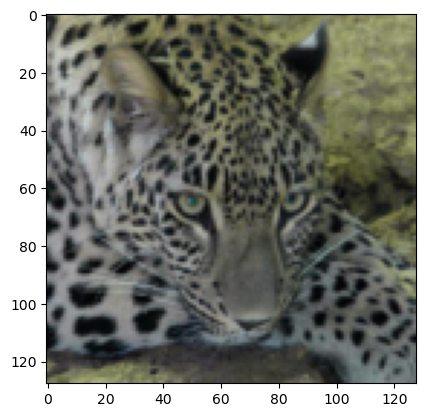

In [87]:
for i in train_dataloader:
    img=i[0][0]
    img = img.permute(1,2,0)
    plt.imshow(img)
    break

In [93]:
device = torch.device("cuda:6")
print(device)
!gpustat

cuda:6
WellsFargo                Tue Sep 26 22:08:04 2023  525.125.06
[0] NVIDIA A100-SXM4-40GB | 45'C, 100 % | 34891 / 40960 MB | ajaymamidi(3254M) manikantab(31000M) gdm(4M) user(4M)
[1] NVIDIA A100-SXM4-40GB | 26'C,   0 % | 20515 / 40960 MB | paraskamble(19302M) gdm(4M) user(4M)
[2] NVIDIA A100-SXM4-40GB | 26'C,   0 % | 22227 / 40960 MB | karmpatel(21520M) gdm(4M) user(4M)
[3] NVIDIA A100-SXM4-40GB | 42'C,  99 % | 36111 / 40960 MB | manikantab(31066M) rajv(1288M) rajv(1284M) rajv(1260M) gdm(4M) user(4M)
[4] NVIDIA A100-SXM4-40GB | 55'C, 100 % | 35125 / 40960 MB | ajaymamidi(3446M) manikantab(31042M) gdm(4M) user(4M)
[5] NVIDIA A100-SXM4-40GB | 36'C, 100 % | 32279 / 40960 MB | manikantab(30490M) gdm(4M) user(4M)
[6] NVIDIA A100-SXM4-40GB | 33'C, 100 % |  9519 / 40960 MB | ajaymamidi(3994M) tonygracious(2862M) bhargavav2(2024M) gdm(4M) user(4M)
[7] NVIDIA A100-SXM4-40GB | 32'C,   0 % | 32461 / 40960 MB | manikantab(30960M) gdm(4M) user(4M)


In [67]:
#VAE Model
class VAE(nn.Module):
    def __init__(self,channel,height,width,beta=1,number_latents=1):
        super().__init__()

        self.channel = channel
        self.height = height
        self.width = width
        self.beta = beta
        self.number_latents = number_latents

        #Encoder Converting (3,128,128) into (64,8,8)
        self.encoder = nn.Sequential(
            nn.Conv2d(self.channel,8,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(8),
            nn.LeakyReLU(),
            nn.Conv2d(8,16,kernel_size=3,stride=2,padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(),
            nn.Conv2d(16,32,kernel_size=3,stride=2,padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.Conv2d(32,64,kernel_size=4,stride=2,padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.Conv2d(64,64,kernel_size=4,stride=2,padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
        )
        self.out_height=8
        self.out_width=8

        #Meam and Sigma
        self.mu = nn.Linear(64*self.out_height*self.out_width , 32)
        self.sigma = nn.Linear(64*self.out_height*self.out_width , 32)

        self.z = nn.Linear(32,64*self.out_height*self.out_width)
        self.N = torch.distributions.Normal(0,1)
        self.N.loc = self.N.loc.to(device)
        self.N.scale = self.N.scale.to(device)


        #Decoder  Converting (64,8,8) into (128,128,3)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(64 , 64 , kernel_size=4 , stride=1 , padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64 , 32 , kernel_size=3 , stride=2 , padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.ConvTranspose2d(32 , 16 , kernel_size=3 , stride=2 , padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.ConvTranspose2d(16 , 8 , kernel_size=3 , stride=2 , padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(),
            nn.ConvTranspose2d(8 , self.channel , kernel_size=2 , stride=2 , padding=1),
            nn.BatchNorm2d(self.channel),
            nn.Sigmoid(),
        )

    #Reparameterization
    def reparam(self,mu,sigma):
        latent = mu + sigma*self.N.sample(mu.shape)
        return latent
    
    #Forward function
    def forward(self,x,loss_fun):
        encoder_output = self.encoder(x)
        encoder_output = torch.flatten(encoder_output,start_dim=1)
        mu = self.mu(encoder_output)
        sigma = torch.exp(self.sigma(encoder_output))
        MSE_loss = 0 
        for item in range(self.number_latents):
            latent = self.reparam(mu,sigma)
            latent = self.z(latent)
            latent = latent.reshape(-1,64,self.out_height,self.out_width)
            decoder_output = self.decoder(latent)
            MSE_loss += loss_fun(x,decoder_output)
        MSE_loss = MSE_loss/self.number_latents
        q = torch.distributions.Normal(mu,sigma)
        KL_loss = torch.mean(torch.distributions.kl.kl_divergence(q,self.N))
        KL_loss = KL_loss * (32 / ( 3 * 128 * 128))
        Loss = MSE_loss + self.beta*(KL_loss) 
        return decoder_output , Loss , MSE_loss , KL_loss


In [155]:
def plot_images(model,x_true,loss_fun):
    x_true=x_true.to(device)
    x_recon,_,_,_ = model(x_true,loss_fun)
    x_recon = x_recon * 100
    x_gen = torch.randn(100,32).to(device)
    x_gen = model.z(x_gen)
    x_gen = x_gen.reshape(-1,64,8,8)
    x_gen = model.decoder(x_gen)
    x_gen = x_gen * 100
    plt.figure(figsize=(20,30))
    plt.subplot(1,3,1)
    plt.axis("off")
    plt.title("Orginal Images")
    plt.imshow(np.transpose(vutils.make_grid(x_true[:100], padding=5, nrow=10,normalize=True).cpu(),(1,2,0))) 
    plt.subplot(1,3,2)
    plt.axis("off")
    plt.title("Reconstructed Images")
    plt.imshow(np.transpose(vutils.make_grid(x_recon[:100], padding=5, nrow=10,normalize=True).cpu(),(1,2,0))) 
    plt.subplot(1,3,3)
    plt.axis("off")
    plt.title("Generated Images")
    plt.imshow(np.transpose(vutils.make_grid(x_gen[:100], padding=5, nrow=10,normalize=True).cpu(),(1,2,0))) 

In [69]:
def train(model,name,loss_fun,optimizer):
    best_loss = 1e+10
    tot_loss =[]
    mse_loss=[]
    kl_loss =[]
    num_epochs = 10
    for i in range(1,num_epochs+1):
        Total_loss = 0
        Total_MSE_loss = 0
        Total_KL_loss = 0
        for xb in tqdm(train_dataloader):
            optimizer.zero_grad()
            xb = xb[0].to(device)
            output,Loss,MSE_loss,KL_loss = model(xb,loss_fun)
            Loss.backward()
            optimizer.step()
            Total_loss += Loss.item()
            Total_MSE_loss +=MSE_loss.item()
            Total_KL_loss +=KL_loss.item()
        Total_loss = Total_loss / len(train_dataloader)
        Total_KL_loss = Total_KL_loss/ len(train_dataloader)
        Total_MSE_loss = Total_MSE_loss / len(train_dataloader)
        
        print(f'Epoch[{i}]  Loss : {round(Total_loss,4)}  MSE : {round(Total_MSE_loss,4)}  KL : {round(Total_KL_loss,4)}')
        tot_loss.append(Total_loss)
        mse_loss.append(Total_MSE_loss)
        kl_loss.append(Total_KL_loss)
        if(Total_loss<best_loss):
            best_loss = Total_loss
            torch.save(model.state_dict() , name)
    plt.plot([i for i in range(1,num_epochs+1)] , tot_loss , label="Total Loss")
    plt.plot([i for i in range(1,num_epochs+1)] , mse_loss , label="Reconstruction Loss")
    plt.plot([i for i in range(1,num_epochs+1)], kl_loss , label = 'KL Loss')
    plt.legend()
    plt.xlabel("#Epochs")
    plt.ylabel("Loss")
    plt.title("Loss Curves for Likelihood")
    plt.show()


In [88]:
def experiment(model,loss_fun):
    for x in test_dataloader:
        src = x[0]
        plot_images(model,src,loss_fun)
        break

100%|██████████| 229/229 [01:16<00:00,  2.99it/s]


Epoch[1]  Loss : 0.05  MSE : 0.0445  KL : 0.0055


100%|██████████| 229/229 [01:16<00:00,  3.00it/s]


Epoch[2]  Loss : 0.0235  MSE : 0.0219  KL : 0.0016


100%|██████████| 229/229 [01:16<00:00,  3.01it/s]


Epoch[3]  Loss : 0.0217  MSE : 0.0201  KL : 0.0016


100%|██████████| 229/229 [01:14<00:00,  3.07it/s]


Epoch[4]  Loss : 0.0212  MSE : 0.0196  KL : 0.0016


100%|██████████| 229/229 [01:14<00:00,  3.07it/s]


Epoch[5]  Loss : 0.0207  MSE : 0.0191  KL : 0.0016


100%|██████████| 229/229 [01:16<00:00,  3.01it/s]


Epoch[6]  Loss : 0.0199  MSE : 0.0184  KL : 0.0016


100%|██████████| 229/229 [01:16<00:00,  3.01it/s]


Epoch[7]  Loss : 0.0197  MSE : 0.0182  KL : 0.0016


100%|██████████| 229/229 [01:16<00:00,  3.00it/s]


Epoch[8]  Loss : 0.0196  MSE : 0.018  KL : 0.0016


100%|██████████| 229/229 [01:15<00:00,  3.04it/s]


Epoch[9]  Loss : 0.0194  MSE : 0.0179  KL : 0.0015


100%|██████████| 229/229 [01:15<00:00,  3.04it/s]


Epoch[10]  Loss : 0.0193  MSE : 0.0178  KL : 0.0015


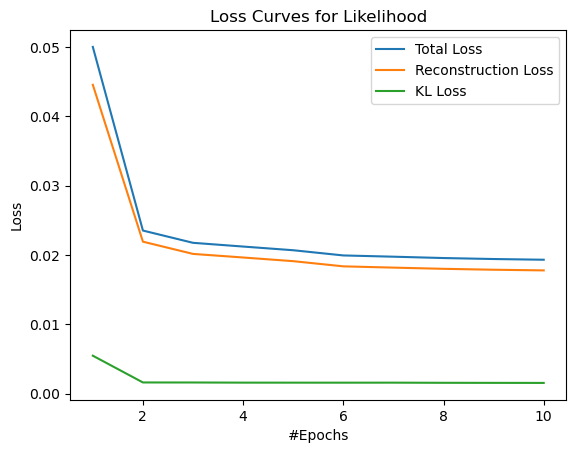

In [73]:
channel , height , width = 3, 128 , 128
model = VAE(channel,height,width)
model.to(device)
loss_fun = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(),lr=1e-3)
train(model,"Vanila-VAE.pth",loss_fun,optimizer)

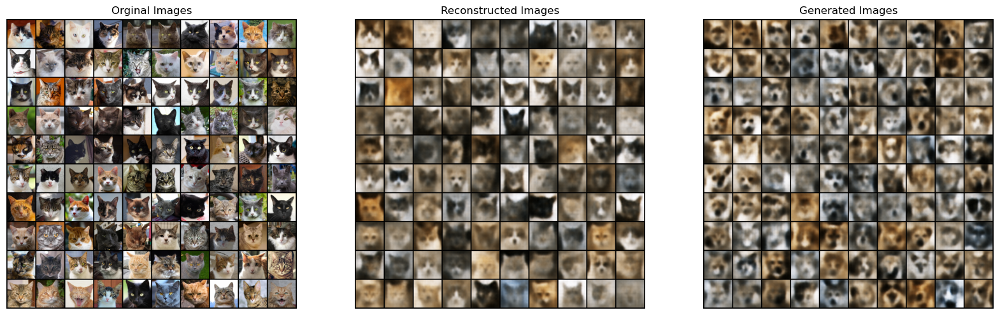

In [89]:
experiment(model,loss_fun)

100%|██████████| 229/229 [01:22<00:00,  2.78it/s]


Epoch[1]  Loss : 0.042  MSE : 0.0403  KL : 0.0017


100%|██████████| 229/229 [01:21<00:00,  2.82it/s]


Epoch[2]  Loss : 0.0226  MSE : 0.021  KL : 0.0016


100%|██████████| 229/229 [01:21<00:00,  2.82it/s]


Epoch[3]  Loss : 0.0212  MSE : 0.0197  KL : 0.0015


100%|██████████| 229/229 [01:22<00:00,  2.79it/s]


Epoch[4]  Loss : 0.0208  MSE : 0.0193  KL : 0.0015


100%|██████████| 229/229 [01:21<00:00,  2.81it/s]


Epoch[5]  Loss : 0.0206  MSE : 0.0191  KL : 0.0015


100%|██████████| 229/229 [01:23<00:00,  2.75it/s]


Epoch[6]  Loss : 0.0204  MSE : 0.019  KL : 0.0015


100%|██████████| 229/229 [01:22<00:00,  2.79it/s]


Epoch[7]  Loss : 0.0203  MSE : 0.0189  KL : 0.0014


100%|██████████| 229/229 [01:22<00:00,  2.79it/s]


Epoch[8]  Loss : 0.0202  MSE : 0.0187  KL : 0.0014


100%|██████████| 229/229 [01:21<00:00,  2.81it/s]


Epoch[9]  Loss : 0.0202  MSE : 0.0187  KL : 0.0014


100%|██████████| 229/229 [01:23<00:00,  2.76it/s]

Epoch[10]  Loss : 0.02  MSE : 0.0186  KL : 0.0014


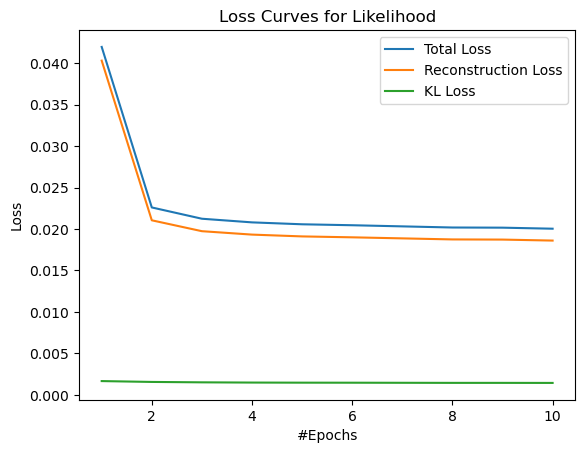

In [76]:
channel , height , width = 3, 128 , 128
model_with_3L = VAE(channel,height,width,number_latents=3)
model_with_3L.to(device)
loss_fun = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model_with_3L.parameters(),lr=1e-3)
train(model_with_3L,"Vanila-VAE-with-3l.pth",loss_fun,optimizer)

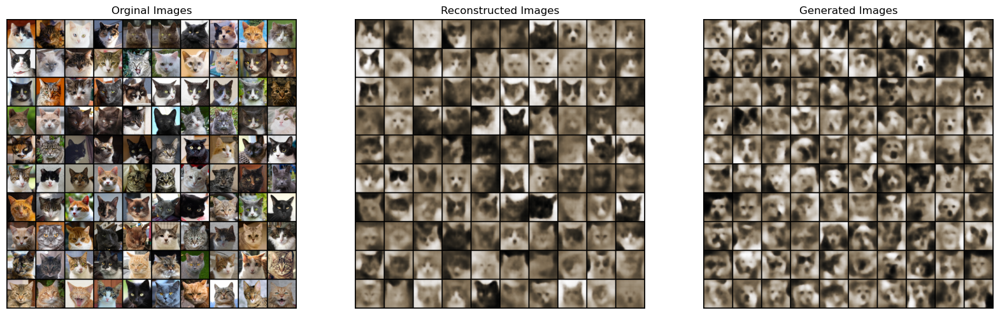

In [90]:
experiment(model_with_3L,loss_fun)

  0%|          | 0/229 [00:00<?, ?it/s]

100%|██████████| 229/229 [01:27<00:00,  2.62it/s]


Epoch[1]  Loss : 0.0467  MSE : 0.0434  KL : 0.0034


100%|██████████| 229/229 [01:27<00:00,  2.61it/s]


Epoch[2]  Loss : 0.0229  MSE : 0.0213  KL : 0.0016


100%|██████████| 229/229 [01:27<00:00,  2.62it/s]


Epoch[3]  Loss : 0.0214  MSE : 0.0199  KL : 0.0015


100%|██████████| 229/229 [01:27<00:00,  2.63it/s]


Epoch[4]  Loss : 0.021  MSE : 0.0195  KL : 0.0015


100%|██████████| 229/229 [01:27<00:00,  2.61it/s]


Epoch[5]  Loss : 0.0207  MSE : 0.0192  KL : 0.0015


100%|██████████| 229/229 [01:26<00:00,  2.64it/s]


Epoch[6]  Loss : 0.0199  MSE : 0.0184  KL : 0.0015


100%|██████████| 229/229 [01:27<00:00,  2.62it/s]


Epoch[7]  Loss : 0.0195  MSE : 0.018  KL : 0.0015


100%|██████████| 229/229 [01:28<00:00,  2.58it/s]


Epoch[8]  Loss : 0.0193  MSE : 0.0178  KL : 0.0015


100%|██████████| 229/229 [01:27<00:00,  2.61it/s]


Epoch[9]  Loss : 0.0191  MSE : 0.0177  KL : 0.0015


100%|██████████| 229/229 [01:27<00:00,  2.62it/s]

Epoch[10]  Loss : 0.0191  MSE : 0.0176  KL : 0.0015


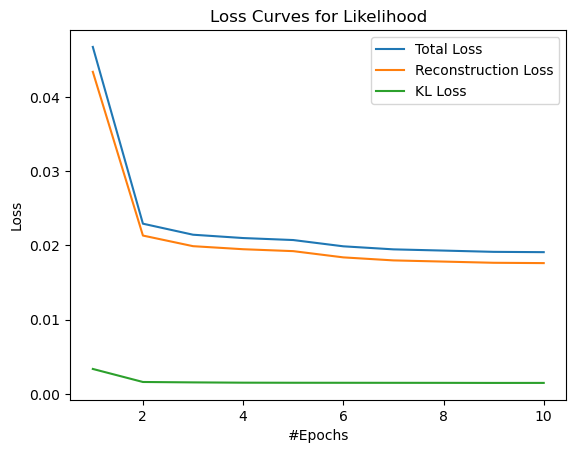

In [84]:
channel , height , width = 3, 128 , 128
model_with_5L = VAE(channel,height,width,number_latents=5)
model_with_5L.to(device)
loss_fun = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model_with_5L.parameters(),lr=1e-3)
train(model_with_5L,"Vanila-VAE-with-5l.pth",loss_fun,optimizer)

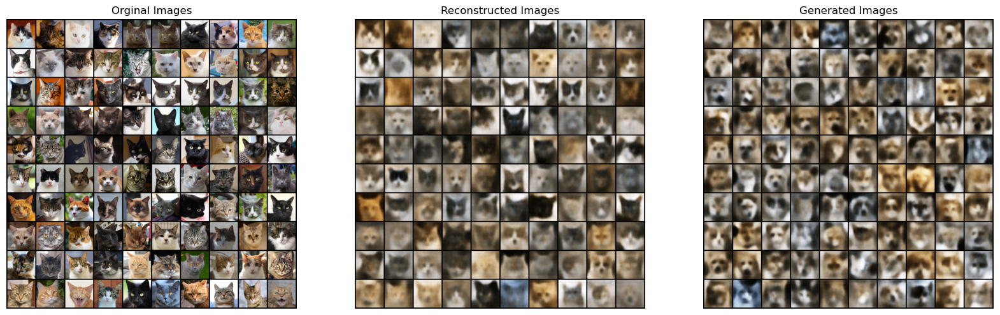

In [91]:
experiment(model_with_5L,loss_fun)

100%|██████████| 229/229 [01:42<00:00,  2.24it/s]


Epoch[1]  Loss : 0.0647  MSE : 0.0613  KL : 0.0034


100%|██████████| 229/229 [01:43<00:00,  2.22it/s]


Epoch[2]  Loss : 0.029  MSE : 0.0275  KL : 0.0015


100%|██████████| 229/229 [01:43<00:00,  2.21it/s]


Epoch[3]  Loss : 0.0218  MSE : 0.0203  KL : 0.0016


100%|██████████| 229/229 [01:43<00:00,  2.22it/s]


Epoch[4]  Loss : 0.0212  MSE : 0.0196  KL : 0.0015


100%|██████████| 229/229 [01:45<00:00,  2.18it/s]


Epoch[5]  Loss : 0.0208  MSE : 0.0194  KL : 0.0015


100%|██████████| 229/229 [01:42<00:00,  2.23it/s]


Epoch[6]  Loss : 0.0207  MSE : 0.0192  KL : 0.0015


100%|██████████| 229/229 [01:43<00:00,  2.21it/s]


Epoch[7]  Loss : 0.0205  MSE : 0.019  KL : 0.0015


100%|██████████| 229/229 [01:42<00:00,  2.24it/s]


Epoch[8]  Loss : 0.0204  MSE : 0.0189  KL : 0.0015


100%|██████████| 229/229 [01:44<00:00,  2.20it/s]


Epoch[9]  Loss : 0.0202  MSE : 0.0188  KL : 0.0015


100%|██████████| 229/229 [01:43<00:00,  2.21it/s]

Epoch[10]  Loss : 0.0195  MSE : 0.018  KL : 0.0015


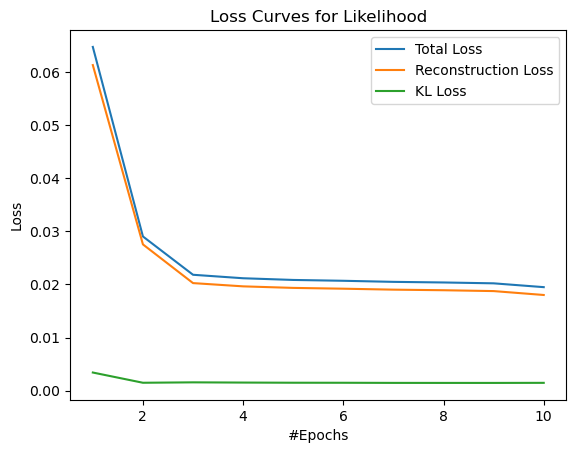

In [82]:
channel , height , width = 3, 128 , 128
model_with_10L = VAE(channel,height,width,number_latents=10)
model_with_10L.to(device)
loss_fun = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model_with_10L.parameters(),lr=1e-3)
train(model_with_10L,"Vanila-VAE-with-10l.pth",loss_fun,optimizer)

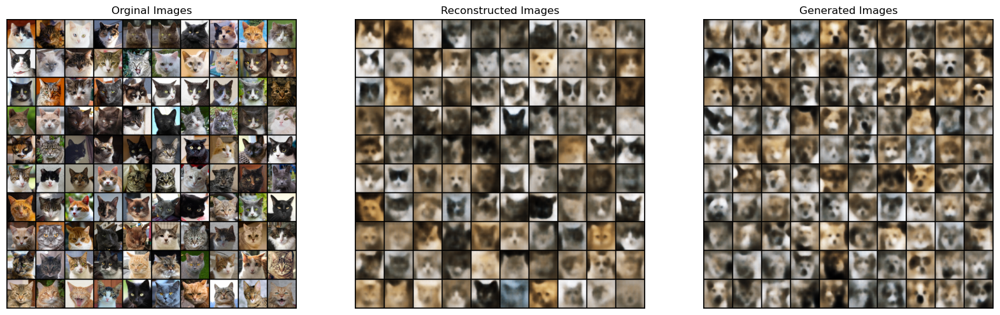

In [92]:
experiment(model_with_10L,loss_fun)

In [127]:
class MLP(nn.Module):
    def __init__(self):
        super().__init__()
        self.mlp_layer =nn.Sequential(
             nn.Linear(64*8*8 , 64),
             nn.ReLU(),
             nn.Linear(64,32),
             nn.ReLU(),
             nn.Linear(32,16),
             nn.ReLU(),
            nn.Linear(16,8),
             nn.ReLU(),            
             nn.Linear(8,3),
             nn.Sigmoid(),
        )
    def forward(self,x,encoder):
        x = encoder(x)
        x = torch.flatten(x,start_dim=1)
        x = self.mlp_layer(x)
        return x

In [138]:
def train_mlp(model_mlp,loss_fun_mlp,optimizer_mlp,encoder):
    loss_mx= 1e+5
    num_epoch=10
    losses=[]
    accuracy=[]
    for i in range(1,num_epoch+1):
        Total_loss=0
        total_correct=0
        total_samples=0
        for xb in tqdm(train_dataloader):
            x=xb[0].to(device)
            y_true =xb[1].to(device).long()
            y_pred = model_mlp(x,encoder)
            loss = loss_fun_mlp(y_pred,y_true)
            optimizer_mlp.zero_grad()
            loss.backward()
            optimizer_mlp.step()
            Total_loss +=loss.item()
            y_pred = torch.argmax(y_pred,dim=1)
            total_correct += (y_pred == y_true).sum().item()
            total_samples +=y_true.size(0)
        Total_loss = Total_loss/len(train_dataloader)
        Total_accuracy = 100 * total_correct / total_samples
        losses.append(Total_loss)
        accuracy.append(Total_accuracy)
        print(f'Epoch [{i}]  Loss : {round(Total_loss,4)}  Accuracy : {round(Total_accuracy,4)}')
        if(Total_loss<loss_mx):
            loss_mx=Total_loss
            torch.save(model_mlp.state_dict() , "Vanila-VAE-MLP.pth")
    print(losses)
    print(accuracy)



In [139]:
model_mlp = MLP()
model_mlp.to(device)
loss_fun_mlp = nn.CrossEntropyLoss()
optimizer_mlp = torch.optim.Adam(model_mlp.parameters(),lr=1e-3)
model.encoder.requires_grad_(False)
train_mlp(model_mlp,loss_fun_mlp,optimizer_mlp,model.encoder)

100%|██████████| 229/229 [01:09<00:00,  3.30it/s]


Epoch [1]  Loss : 0.8906  Accuracy : 63.2604


100%|██████████| 229/229 [01:09<00:00,  3.31it/s]


Epoch [2]  Loss : 0.7495  Accuracy : 79.3575


100%|██████████| 229/229 [01:10<00:00,  3.26it/s]


Epoch [3]  Loss : 0.7184  Accuracy : 82.2078


100%|██████████| 229/229 [01:10<00:00,  3.27it/s]


Epoch [4]  Loss : 0.6967  Accuracy : 84.6275


100%|██████████| 229/229 [01:10<00:00,  3.24it/s]


Epoch [5]  Loss : 0.6878  Accuracy : 85.7075


100%|██████████| 229/229 [01:10<00:00,  3.24it/s]


Epoch [6]  Loss : 0.6753  Accuracy : 86.7601


100%|██████████| 229/229 [01:10<00:00,  3.24it/s]


Epoch [7]  Loss : 0.6683  Accuracy : 87.8879


100%|██████████| 229/229 [01:11<00:00,  3.22it/s]


Epoch [8]  Loss : 0.6653  Accuracy : 87.9836


100%|██████████| 229/229 [01:09<00:00,  3.27it/s]


Epoch [9]  Loss : 0.6553  Accuracy : 88.8517


100%|██████████| 229/229 [01:10<00:00,  3.26it/s]

Epoch [10]  Loss : 0.6568  Accuracy : 88.6808
[0.8906240369555211, 0.7495191201372439, 0.7183563110609763, 0.6967271792836585, 0.6878198148381762, 0.6753488995102295, 0.6683210712332913, 0.6652851021445995, 0.655288541421099, 0.6567873194748658]
[63.26042378673958, 79.35748462064251, 82.20779220779221, 84.62747778537252, 85.70745044429255, 86.76008202323992, 87.8879015721121, 87.98359535201641, 88.85167464114832, 88.6807928913192]


In [142]:
def test_mlp(test_model_mlp,test_dataloader,encoder):
    total_correct=0
    total_samples=0
    for xb in tqdm(test_dataloader):
        x_true=xb[0].to(device)
        y_true=xb[1].to(device)
        y_pred = test_model_mlp(x_true,encoder)
        y_pred = torch.argmax(y_pred,dim=1)
        total_correct += (y_pred == y_true).sum().item()
        total_samples += y_true.size(0)
    accuracy = 100 * total_correct / total_samples
    print(f'Test Accurcay : {round(accuracy,4)}')


In [144]:
test_model_mlp = MLP()
test_model_mlp.load_state_dict(torch.load("Vanila-VAE-MLP.pth"))
test_model_mlp.to(device)
test_mlp(test_model_mlp,test_dataloader,model.encoder)

100%|██████████| 15/15 [00:07<00:00,  2.11it/s]

Test Accurcay : 81.0


100%|██████████| 229/229 [01:17<00:00,  2.97it/s]


Epoch[1]  Loss : 0.0517  MSE : 0.0505  KL : 0.006


100%|██████████| 229/229 [01:15<00:00,  3.04it/s]


Epoch[2]  Loss : 0.022  MSE : 0.0214  KL : 0.0031


100%|██████████| 229/229 [01:14<00:00,  3.06it/s]


Epoch[3]  Loss : 0.0204  MSE : 0.0198  KL : 0.0029


100%|██████████| 229/229 [01:15<00:00,  3.02it/s]


Epoch[4]  Loss : 0.0198  MSE : 0.0193  KL : 0.0027


100%|██████████| 229/229 [01:15<00:00,  3.04it/s]


Epoch[5]  Loss : 0.0196  MSE : 0.019  KL : 0.0026


100%|██████████| 229/229 [01:14<00:00,  3.06it/s]


Epoch[6]  Loss : 0.0193  MSE : 0.0188  KL : 0.0025


100%|██████████| 229/229 [01:15<00:00,  3.04it/s]


Epoch[7]  Loss : 0.0192  MSE : 0.0187  KL : 0.0025


100%|██████████| 229/229 [01:15<00:00,  3.03it/s]


Epoch[8]  Loss : 0.0191  MSE : 0.0186  KL : 0.0025


100%|██████████| 229/229 [01:15<00:00,  3.04it/s]


Epoch[9]  Loss : 0.019  MSE : 0.0186  KL : 0.0024


100%|██████████| 229/229 [01:15<00:00,  3.03it/s]


Epoch[10]  Loss : 0.0189  MSE : 0.0184  KL : 0.0024


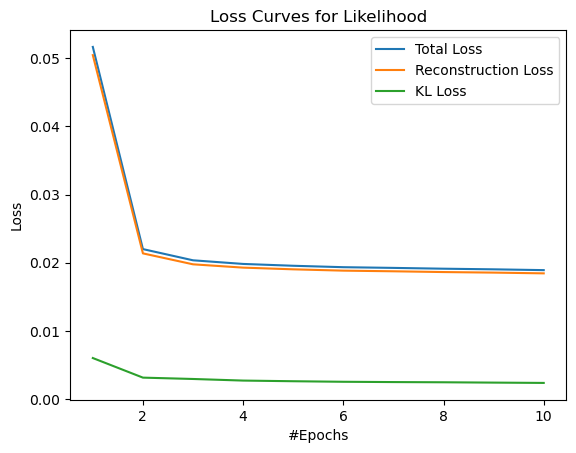

In [145]:
channel , height , width = 3, 128 , 128
beta_vae_model1 = VAE(channel,height,width,beta=0.2)
beta_vae_model1.to(device)
loss_fun = torch.nn.MSELoss()
optimizer = torch.optim.Adam(beta_vae_model1.parameters(),lr=1e-3)
train(beta_vae_model1,"Beta-VAE1.pth",loss_fun,optimizer)

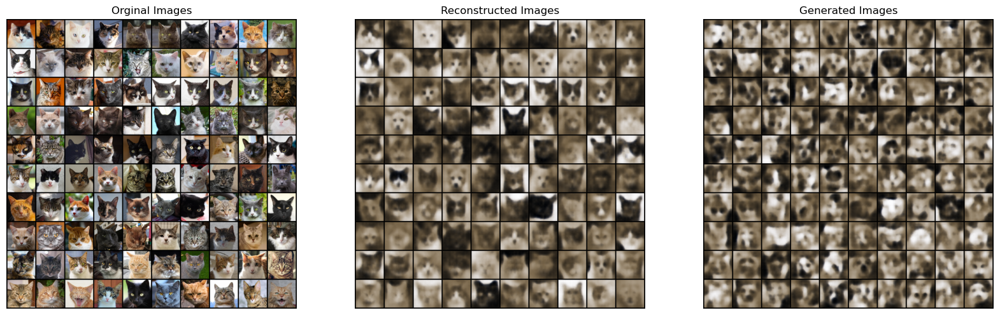

In [146]:
experiment(beta_vae_model1,loss_fun)

100%|██████████| 229/229 [01:15<00:00,  3.05it/s]


Epoch[1]  Loss : 0.0585  MSE : 0.0453  KL : 0.0332


100%|██████████| 229/229 [01:15<00:00,  3.05it/s]


Epoch[2]  Loss : 0.0246  MSE : 0.0236  KL : 0.0026


100%|██████████| 229/229 [01:15<00:00,  3.04it/s]


Epoch[3]  Loss : 0.022  MSE : 0.021  KL : 0.0025


100%|██████████| 229/229 [01:16<00:00,  2.98it/s]


Epoch[4]  Loss : 0.0212  MSE : 0.0203  KL : 0.0024


100%|██████████| 229/229 [01:15<00:00,  3.04it/s]


Epoch[5]  Loss : 0.0206  MSE : 0.0197  KL : 0.0024


100%|██████████| 229/229 [01:15<00:00,  3.03it/s]


Epoch[6]  Loss : 0.0198  MSE : 0.0188  KL : 0.0024


100%|██████████| 229/229 [01:16<00:00,  3.00it/s]


Epoch[7]  Loss : 0.0194  MSE : 0.0185  KL : 0.0023


100%|██████████| 229/229 [01:15<00:00,  3.03it/s]


Epoch[8]  Loss : 0.0192  MSE : 0.0183  KL : 0.0023


100%|██████████| 229/229 [01:17<00:00,  2.97it/s]


Epoch[9]  Loss : 0.019  MSE : 0.0181  KL : 0.0023


100%|██████████| 229/229 [01:16<00:00,  2.98it/s]

Epoch[10]  Loss : 0.0188  MSE : 0.0179  KL : 0.0022


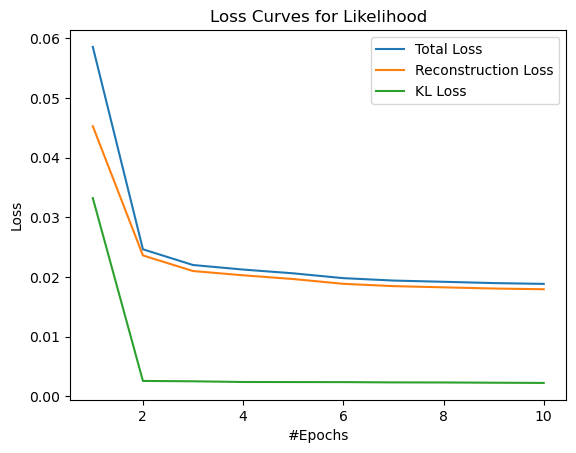

In [147]:
channel , height , width = 3, 128 , 128
beta_vae_model2 = VAE(channel,height,width,beta=0.4)
beta_vae_model2.to(device)
loss_fun = torch.nn.MSELoss()
optimizer = torch.optim.Adam(beta_vae_model2.parameters(),lr=1e-3)
train(beta_vae_model2,"Beta-VAE2.pth",loss_fun,optimizer)

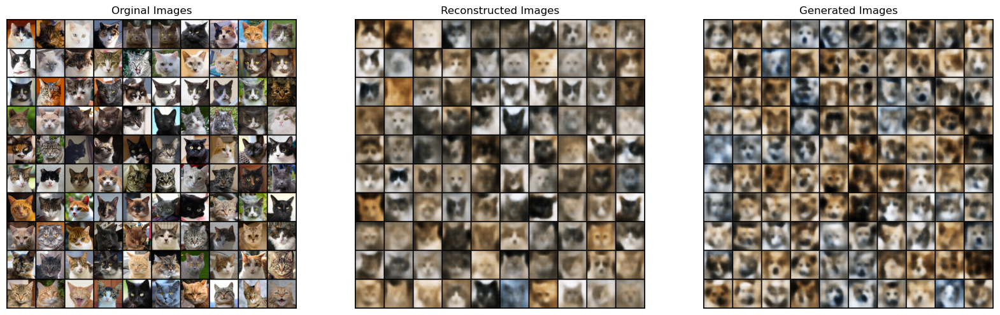

In [148]:
experiment(beta_vae_model2,loss_fun)

100%|██████████| 229/229 [01:15<00:00,  3.04it/s]


Epoch[1]  Loss : 0.0466  MSE : 0.0451  KL : 0.0024


100%|██████████| 229/229 [01:15<00:00,  3.03it/s]


Epoch[2]  Loss : 0.0229  MSE : 0.0217  KL : 0.0019


100%|██████████| 229/229 [01:14<00:00,  3.06it/s]


Epoch[3]  Loss : 0.0211  MSE : 0.02  KL : 0.0018


100%|██████████| 229/229 [01:16<00:00,  3.00it/s]


Epoch[4]  Loss : 0.0205  MSE : 0.0195  KL : 0.0018


100%|██████████| 229/229 [01:16<00:00,  2.99it/s]


Epoch[5]  Loss : 0.0202  MSE : 0.0192  KL : 0.0017


100%|██████████| 229/229 [01:15<00:00,  3.03it/s]


Epoch[6]  Loss : 0.02  MSE : 0.019  KL : 0.0017


100%|██████████| 229/229 [01:15<00:00,  3.05it/s]


Epoch[7]  Loss : 0.0199  MSE : 0.0188  KL : 0.0017


100%|██████████| 229/229 [01:14<00:00,  3.09it/s]


Epoch[8]  Loss : 0.0197  MSE : 0.0187  KL : 0.0017


100%|██████████| 229/229 [01:14<00:00,  3.06it/s]


Epoch[9]  Loss : 0.0197  MSE : 0.0187  KL : 0.0017


100%|██████████| 229/229 [01:15<00:00,  3.05it/s]


Epoch[10]  Loss : 0.0194  MSE : 0.0184  KL : 0.0017


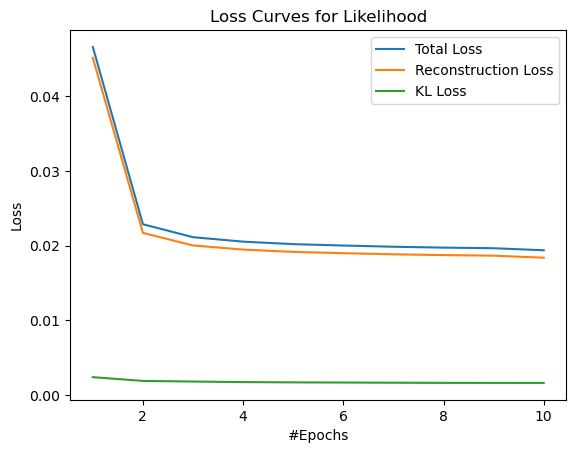

In [149]:
channel , height , width = 3, 128 , 128
beta_vae_model3 = VAE(channel,height,width,beta=0.6)
beta_vae_model3.to(device)
loss_fun = torch.nn.MSELoss()
optimizer = torch.optim.Adam(beta_vae_model3.parameters(),lr=1e-3)
train(beta_vae_model3,"Beta-VAE3.pth",loss_fun,optimizer)

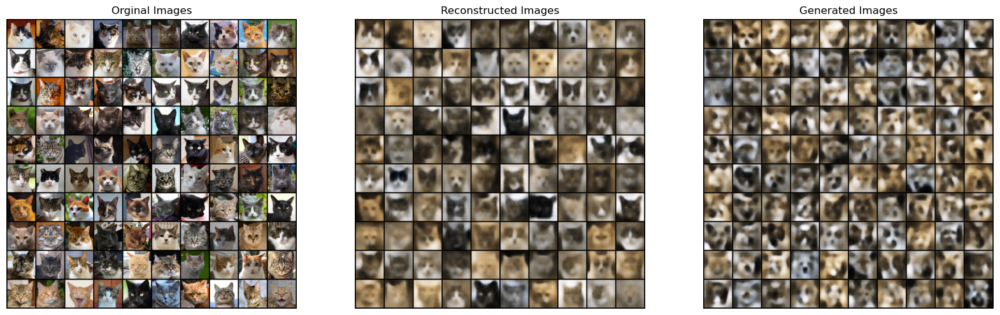

In [157]:
experiment(beta_vae_model3,loss_fun)

100%|██████████| 229/229 [01:16<00:00,  3.01it/s]


Epoch[1]  Loss : 0.0611  MSE : 0.0484  KL : 0.0159


100%|██████████| 229/229 [01:14<00:00,  3.06it/s]


Epoch[2]  Loss : 0.024  MSE : 0.0226  KL : 0.0018


100%|██████████| 229/229 [01:16<00:00,  3.01it/s]


Epoch[3]  Loss : 0.0217  MSE : 0.0203  KL : 0.0018


100%|██████████| 229/229 [01:15<00:00,  3.02it/s]


Epoch[4]  Loss : 0.0211  MSE : 0.0197  KL : 0.0018


100%|██████████| 229/229 [01:16<00:00,  3.00it/s]


Epoch[5]  Loss : 0.0209  MSE : 0.0195  KL : 0.0017


100%|██████████| 229/229 [01:15<00:00,  3.05it/s]


Epoch[6]  Loss : 0.0207  MSE : 0.0193  KL : 0.0017


100%|██████████| 229/229 [01:14<00:00,  3.06it/s]


Epoch[7]  Loss : 0.0205  MSE : 0.0192  KL : 0.0017


100%|██████████| 229/229 [01:15<00:00,  3.03it/s]


Epoch[8]  Loss : 0.0204  MSE : 0.019  KL : 0.0017


100%|██████████| 229/229 [01:15<00:00,  3.01it/s]


Epoch[9]  Loss : 0.0203  MSE : 0.019  KL : 0.0017


100%|██████████| 229/229 [01:15<00:00,  3.02it/s]


Epoch[10]  Loss : 0.0202  MSE : 0.0189  KL : 0.0017


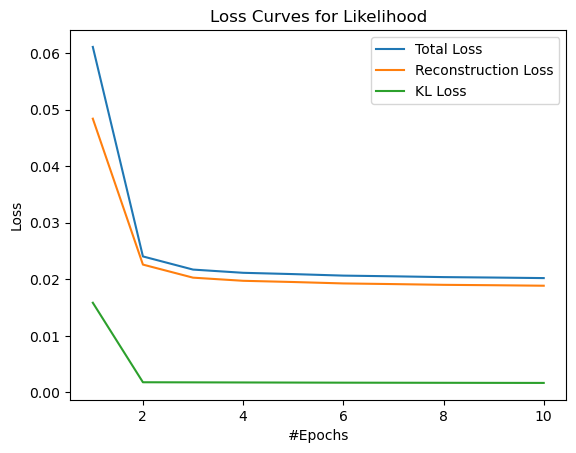

In [171]:
channel , height , width = 3, 128 , 128
beta_vae_model4 = VAE(channel,height,width,beta=0.8)
beta_vae_model4.to(device)
loss_fun = torch.nn.MSELoss()
optimizer = torch.optim.Adam(beta_vae_model4.parameters(),lr=1e-3)
train(beta_vae_model4,"Beta-VAE4.pth",loss_fun,optimizer)

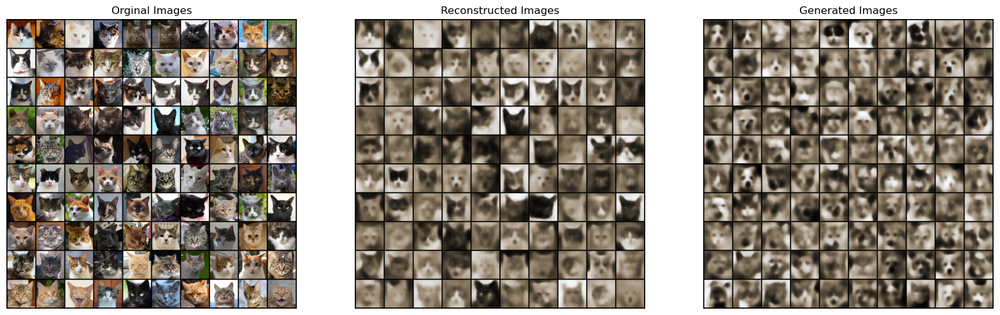

In [172]:
experiment(beta_vae_model4,loss_fun)

In [170]:
#AutoEncoder Model
class AutoEncoder(nn.Module):
    def __init__(self,channel,height,width):
        super().__init__()

        self.channel = channel
        self.height = height
        self.width = width

        #Encoder Converting (3,128,128) into (64,8,8)
        self.encoder = nn.Sequential(
            nn.Conv2d(self.channel,8,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(8),
            nn.LeakyReLU(),
            nn.Conv2d(8,16,kernel_size=3,stride=2,padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(),
            nn.Conv2d(16,32,kernel_size=3,stride=2,padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.Conv2d(32,64,kernel_size=4,stride=2,padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.Conv2d(64,64,kernel_size=4,stride=2,padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
        )
        self.end_encoder = nn.Linear(64*8*8,64)
        self.Z = nn.Linear(64 , 32)
        self.Z_back=nn.Linear(32,64)
        self.start_decoder = nn.Linear(64 , 64*8*8)

        #Decoder  Converting (64,8,8) into (128,128,3)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(64 , 64 , kernel_size=4 , stride=1 , padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64 , 32 , kernel_size=3 , stride=2 , padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.ConvTranspose2d(32 , 16 , kernel_size=3 , stride=2 , padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.ConvTranspose2d(16 , 8 , kernel_size=3 , stride=2 , padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(),
            nn.ConvTranspose2d(8 , self.channel , kernel_size=2 , stride=2 , padding=1),
            nn.BatchNorm2d(self.channel),
            nn.Sigmoid(),
        )


    
    #Forward function
    def forward(self,x,loss_fun):
        encoder_output = self.encoder(x)
        encoder_output = torch.flatten(encoder_output,start_dim=1)
        end_out = self.end_encoder(encoder_output)
        Z1 = self.Z(end_out)
        Z2 = self.Z_back(Z1)
        start_in = self.start_decoder(Z2)
        start_in = start_in.reshape(-1,64,8,8)
        decoder_output = self.decoder(start_in)
        MSE_loss = loss_fun(x,decoder_output)
        return decoder_output ,  MSE_loss 


In [164]:
def train_auto_encoder(model_ae,name,loss_fun_ae,optimizer_ae):
    best_loss = 1e+10
    tot_loss =[]
    num_epochs = 10
    for i in range(1,num_epochs+1):
        Total_loss = 0
        for xb in tqdm(train_dataloader):
            optimizer_ae.zero_grad()
            xb = xb[0].to(device)
            output,Loss = model_ae(xb,loss_fun_ae)
            Loss.backward()
            optimizer_ae.step()
            Total_loss += Loss.item()
        Total_loss = Total_loss / len(train_dataloader)
        print(f'Epoch[{i}]  Loss : {round(Total_loss,4)}')
        tot_loss.append(Total_loss)
        if(Total_loss<best_loss):
            best_loss = Total_loss
            torch.save(model.state_dict(),name)
    plt.plot([i for i in range(1,num_epochs+1)] , tot_loss , label="Total Loss")
    plt.legend()
    plt.xlabel("#Epochs")
    plt.ylabel("Loss")
    plt.title("Loss Curves for MSE")
    plt.show()

100%|██████████| 229/229 [01:12<00:00,  3.17it/s]


Epoch[1]  Loss : 0.0618


100%|██████████| 229/229 [01:11<00:00,  3.18it/s]


Epoch[2]  Loss : 0.0448


100%|██████████| 229/229 [01:12<00:00,  3.16it/s]


Epoch[3]  Loss : 0.0264


100%|██████████| 229/229 [01:12<00:00,  3.16it/s]


Epoch[4]  Loss : 0.0232


100%|██████████| 229/229 [01:12<00:00,  3.14it/s]


Epoch[5]  Loss : 0.0213


100%|██████████| 229/229 [01:14<00:00,  3.07it/s]


Epoch[6]  Loss : 0.0203


100%|██████████| 229/229 [01:13<00:00,  3.10it/s]


Epoch[7]  Loss : 0.0195


100%|██████████| 229/229 [01:13<00:00,  3.12it/s]


Epoch[8]  Loss : 0.019


100%|██████████| 229/229 [01:13<00:00,  3.11it/s]


Epoch[9]  Loss : 0.0187


100%|██████████| 229/229 [01:12<00:00,  3.15it/s]


Epoch[10]  Loss : 0.0185


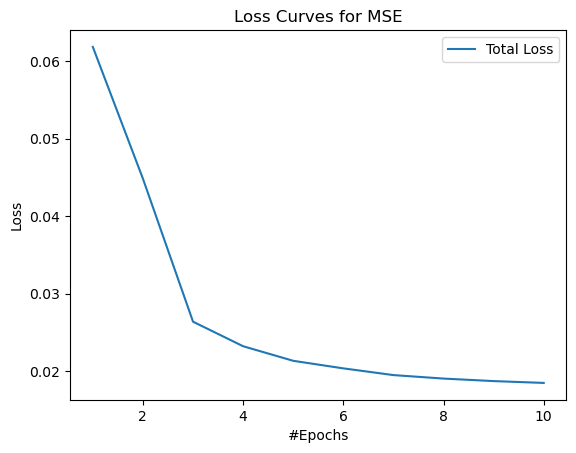

In [165]:
channel , height , width = 3, 128 , 128
model_ae = AutoEncoder(channel , height , width)
model_ae.to(device)
loss_fun_ae = nn.MSELoss()
optimizer_ae = torch.optim.Adam(model_ae.parameters(),lr=1e-3)
train_auto_encoder(model_ae,"AutoEncoder.pth",loss_fun_ae,optimizer_ae)


In [167]:
def plot_images_ae(model,x_true,loss_fun):
    x_true=x_true.to(device)
    x_recon,_ = model(x_true,loss_fun)
    x_recon = x_recon * 100
    plt.figure(figsize=(20,20))
    plt.subplot(1,2,1)
    plt.axis("off")
    plt.title("Orginal Images")
    plt.imshow(np.transpose(vutils.make_grid(x_true[:100], padding=5, nrow=10,normalize=True).cpu(),(1,2,0))) 
    plt.subplot(1,2,2)
    plt.axis("off")
    plt.title("Reconstructed Images")
    plt.imshow(np.transpose(vutils.make_grid(x_recon[:100], padding=5, nrow=10,normalize=True).cpu(),(1,2,0))) 

In [168]:
def experiment_ae(model,loss_fun):
    for x in test_dataloader:
        src = x[0]
        plot_images_ae(model,src,loss_fun)
        break

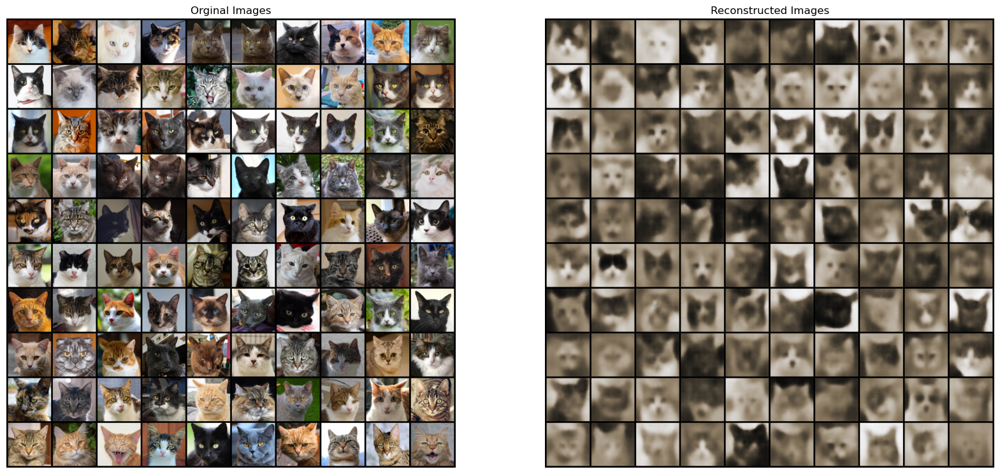

In [169]:
experiment_ae(model_ae,loss_fun_ae)

In [173]:
class AE_MLP(nn.Module):
    def __init__(self):
        super().__init__()
        self.mlp_layer =nn.Sequential(
             nn.Linear(32,16),
             nn.ReLU(),
            nn.Linear(16,8),
             nn.ReLU(),            
             nn.Linear(8,3),
             nn.Sigmoid(),
        )
    def forward(self,x,encoder,end_encoder,Z):
        x = encoder(x)
        x = torch.flatten(x,start_dim=1)
        x = end_encoder(x)
        x = Z(x)
        x = self.mlp_layer(x)
        return x

In [174]:
def train_ae_mlp(model_ae_mlp,loss_fun_ae_mlp,optimizer_ae_mlp,encoder,end_encoder,Z):
    loss_mx= 1e+5
    num_epoch=10
    losses=[]
    accuracy=[]
    for i in range(1,num_epoch+1):
        Total_loss=0
        total_correct=0
        total_samples=0
        for xb in tqdm(train_dataloader):
            x=xb[0].to(device)
            y_true =xb[1].to(device).long()
            y_pred = model_ae_mlp(x,encoder,end_encoder,Z)
            loss = loss_fun_ae_mlp(y_pred,y_true)
            optimizer_ae_mlp.zero_grad()
            loss.backward()
            optimizer_ae_mlp.step()
            Total_loss +=loss.item()
            y_pred = torch.argmax(y_pred,dim=1)
            total_correct += (y_pred == y_true).sum().item()
            total_samples +=y_true.size(0)
        Total_loss = Total_loss/len(train_dataloader)
        Total_accuracy = 100 * total_correct / total_samples
        losses.append(Total_loss)
        accuracy.append(Total_accuracy)
        print(f'Epoch [{i}]  Loss : {round(Total_loss,4)}  Accuracy : {round(Total_accuracy,4)}')
        if(Total_loss<loss_mx):
            loss_mx=Total_loss
            torch.save(model_mlp.state_dict() , "AutoEncoder-MLP.pth")
    print(losses)
    print(accuracy)

In [175]:
model_ae_mlp = AE_MLP()
model_ae_mlp.to(device)
loss_fun_ae_mlp = nn.CrossEntropyLoss()
optimizer_ae_mlp = torch.optim.Adam(model_ae_mlp.parameters(),lr=1e-3)
model_ae.encoder.requires_grad_(False)
model_ae.end_encoder.requires_grad_(False)
model_ae.Z.requires_grad_(False)
train_ae_mlp(model_ae_mlp , loss_fun_ae_mlp , optimizer_ae_mlp ,model_ae.encoder , model_ae.end_encoder,model_ae.Z)

100%|██████████| 229/229 [01:11<00:00,  3.21it/s]


Epoch [1]  Loss : 1.0028  Accuracy : 55.1675


100%|██████████| 229/229 [01:12<00:00,  3.15it/s]


Epoch [2]  Loss : 0.8608  Accuracy : 68.2433


100%|██████████| 229/229 [01:09<00:00,  3.28it/s]


Epoch [3]  Loss : 0.8269  Accuracy : 71.2987


100%|██████████| 229/229 [01:09<00:00,  3.30it/s]


Epoch [4]  Loss : 0.8095  Accuracy : 72.8845


100%|██████████| 229/229 [01:09<00:00,  3.31it/s]


Epoch [5]  Loss : 0.7974  Accuracy : 74.0396


100%|██████████| 229/229 [01:10<00:00,  3.25it/s]


Epoch [6]  Loss : 0.7887  Accuracy : 75.0923


100%|██████████| 229/229 [01:11<00:00,  3.20it/s]


Epoch [7]  Loss : 0.7823  Accuracy : 75.6186


100%|██████████| 229/229 [01:10<00:00,  3.24it/s]


Epoch [8]  Loss : 0.7774  Accuracy : 76.056


100%|██████████| 229/229 [01:10<00:00,  3.25it/s]


Epoch [9]  Loss : 0.7734  Accuracy : 76.3226


100%|██████████| 229/229 [01:10<00:00,  3.27it/s]

Epoch [10]  Loss : 0.7694  Accuracy : 76.9788
[1.0028325699302307, 0.8607701208914211, 0.8268688097270815, 0.8095453110844808, 0.7974277432829011, 0.788672708007446, 0.782309991563772, 0.7773573049811817, 0.773355982969942, 0.7694246964163135]
[55.16746411483253, 68.24333561175666, 71.2987012987013, 72.88448393711552, 74.03964456596036, 75.09227614490773, 75.61859193438141, 76.05604921394395, 76.32262474367738, 76.97881066302119]


In [188]:
def test_ae_mlp(test_model_ae_mlp,test_dataloader,encoder,end_enoder,Z):
    total_correct=0
    total_samples=0
    for xb in tqdm(test_dataloader):
        x_true=xb[0].to(device)
        y_true=xb[1].to(device)
        y_pred = test_model_ae_mlp(x_true,encoder,end_enoder,Z)
        y_pred = torch.argmax(y_pred,dim=1)
        total_correct += (y_pred == y_true).sum().item()
        total_samples += y_true.size(0)
    accuracy = 100 * total_correct / total_samples
    print(f'Test Accurcay : {round(accuracy,4)}')

In [191]:
test_ae_mlp(model_ae_mlp,test_dataloader,model_ae.encoder,model_ae.end_encoder,model_ae.Z)

100%|██████████| 15/15 [00:07<00:00,  2.10it/s]

Test Accurcay : 71.0667
